##Lab 3
Palmer Nelson #47066829

Code snippets adapted from:
https://github.com/8000net/LectureNotesMaster/blob/master/04%20LectureVisualizingConvnets.ipynb

https://keras.io/api/applications/#usage-examples-for-image-classification-models



In [ ]:
# watermark the notebook
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

import sys
import tensorflow.keras
import scipy as sp
import tensorflow as tf
import platform
import numpy as np
import matplotlib.pyplot as plt


print(f"Python Platform: {platform.platform()}")

print(f"Python Platform: {platform.platform()}")
print(f"Python {sys.version}")


Python Platform: Linux-6.1.58+-x86_64-with-glibc2.35
Python Platform: Linux-6.1.58+-x86_64-with-glibc2.35
Python 3.10.12 (main, Nov 20 2023, 15:14:05) [GCC 11.4.0]


In [ ]:
from tensorflow.keras.applications import VGG16

# Load the VGG16 model, pre-trained on ImageNet data
model = VGG16(weights='imagenet')

# Set the model to be frozen (no reason to update any params)
for layer in model.layers:
    layer.trainable = False

model.summary()  # As a reminder of the model's architecture


Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
model.save('vgg')


The model chosen is VGG16, a popular deep convolutional neural network model. VGG16 was introduced by Karen Simonyan and Andrew Zisserman from the University of Oxford in a paper titled "Very Deep Convolutional Networks for Large-Scale Image Classififcation.VGG16 is characterized by its simplicity, consisting mainly of convolutional layers stacked on top of each other in increasing depth. Precisely, it includes 13 convolutional layers, 5 max pooling layers, and 3 fully connected layers. VGG16 is pre-trained on the ImageNet dataset, which contains over 14 million images categorized into 1000 classes.

In [ ]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications.vgg16 import preprocess_input, decode_predictions
from tensorflow.keras.preprocessing import image
import numpy as np


# Load an image file to test, resizing it to 224x224 pixels (required input size for VGG16)
img_path1 = '/content/drive/MyDrive/pics/stingray.jpg'
img1 = image.load_img(img_path1, target_size=(224, 224))

img_path2 = '/content/drive/MyDrive/pics/tigershark.jpg'
img2 = image.load_img(img_path2, target_size=(224, 224))

img_path3 = '/content/drive/MyDrive/pics/vulture.jpg'
img3 = image.load_img(img_path3, target_size=(224, 224))


# Convert the image to a numpy array and add a batch dimension
x1 = image.img_to_array(img1)
x2 = image.img_to_array(img2)
x3 = image.img_to_array(img3)

# Add a batch dimension (required for VGG16
x1 = np.expand_dims(x1, axis=0)
x2 = np.expand_dims(x2, axis=0)
x3 = np.expand_dims(x3, axis=0)

# Pre-process the image for the VGG16 model
x1 = preprocess_input(x1)
x2 = preprocess_input(x2)
x3 = preprocess_input(x3)

# Predict the image class
predictions1 = model.predict(x1)
predictions2 = model.predict(x2)
predictions3 = model.predict(x3)

# Decode the prediction
print('Predicted:', decode_predictions(predictions1, top=3)[0])
print('Predicted:', decode_predictions(predictions2, top=3)[0])
print('Predicted:', decode_predictions(predictions3, top=3)[0])

1/1 [==============================] - 1s 918ms/step
Predicted: [('n01774384', 'black_widow', 0.23068139), ('n01498041', 'stingray', 0.17736463), ('n02219486', 'ant', 0.13229331)]
Predicted: [('n01491361', 'tiger_shark', 0.9897529), ('n01484850', 'great_white_shark', 0.008178558), ('n02536864', 'coho', 0.0003818624)]
Predicted: [('n01616318', 'vulture', 0.98463076), ('n02002556', 'white_stork', 0.004256291), ('n01608432', 'kite', 0.003602332)]


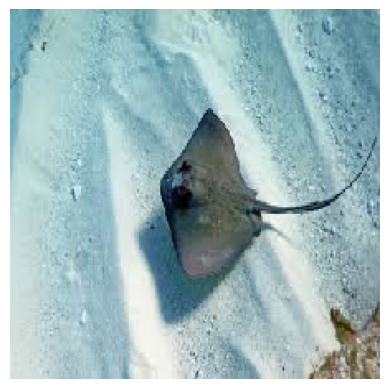

In [ ]:
plt.imshow(img1)
plt.axis('off')  # To not show axis values
plt.show()

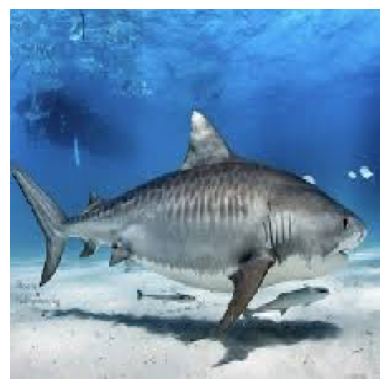

In [ ]:
plt.imshow(img2)
plt.axis('off')  # To not show axis values
plt.show()

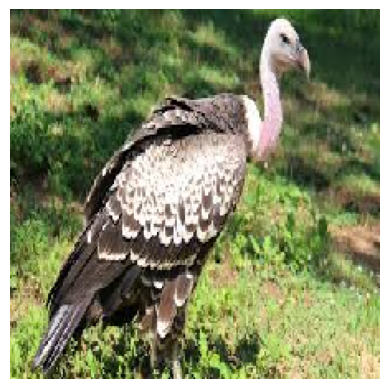

In [ ]:
plt.imshow(img3)
plt.axis('off')
plt.show()

The model appears to be preforming as expected, having classified the tiger shark and vutlure correctly and it almost classified the stingray correctly.

In [ ]:
from tensorflow.keras import models
img_tensor = np.expand_dims(img3, axis=0)
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in model.layers[:8]]

# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# This will return a list of Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img_tensor)
print(len(activations))

[print(x.shape) for x in activations]

1/1 [==============================] - 0s 307ms/step
8
(1, 224, 224, 3)
(1, 224, 224, 64)
(1, 224, 224, 64)
(1, 112, 112, 64)
(1, 112, 112, 128)
(1, 112, 112, 128)
(1, 56, 56, 128)
(1, 56, 56, 256)


[None, None, None, None, None, None, None, None]

<ipython-input-85-dc86bfa630ce>:40: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  plt.imshow(display_grid, aspect='auto', cmap='viridis')
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:64: RuntimeWarning: divide by zero encountered in scalar divide
  fig.patch.set_bounds(x0 / w1, y0 / h1,
/usr/local/lib/python3.10/dist-packages/matplotlib/_tight_bbox.py:65: RuntimeWarning: divide by zero encountered in scalar divide
  fig.bbox.width / w1, fig.bbox.height / h1)
/usr/local/lib/python3.10/dist-packages/matplotlib/patches.py:739: RuntimeWarning: invalid value encountered in scalar add
  y1 = self.convert_yunits(self._y0 + self._height)
/usr/local/lib/python3.10/dist-packages/matplotlib/transforms.py:2042: RuntimeWarning: invalid value encountered in scalar add
  self._mtx[1, 2] += ty


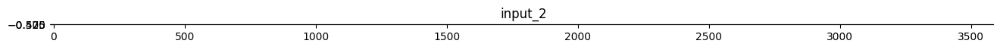

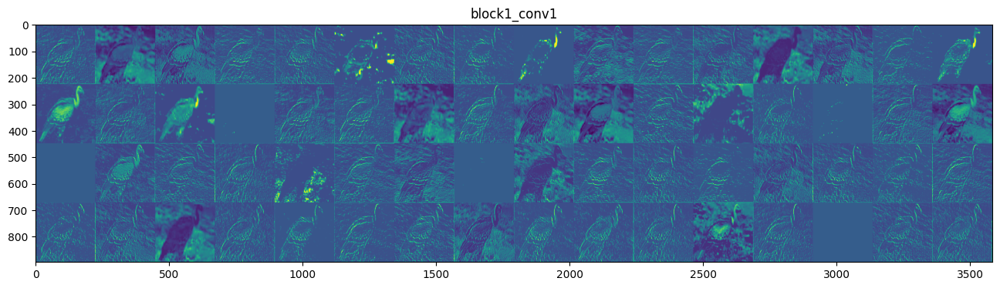

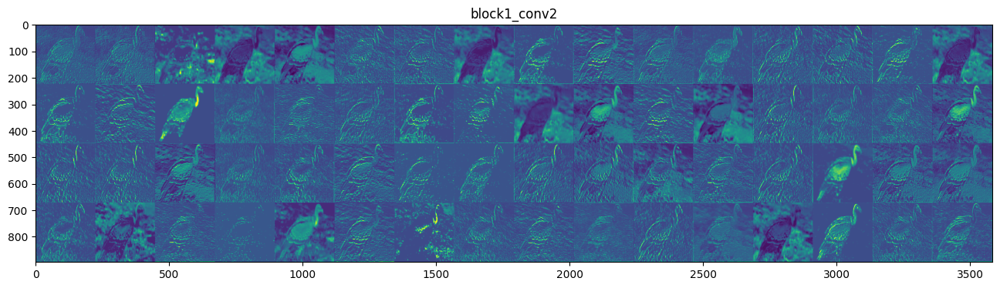

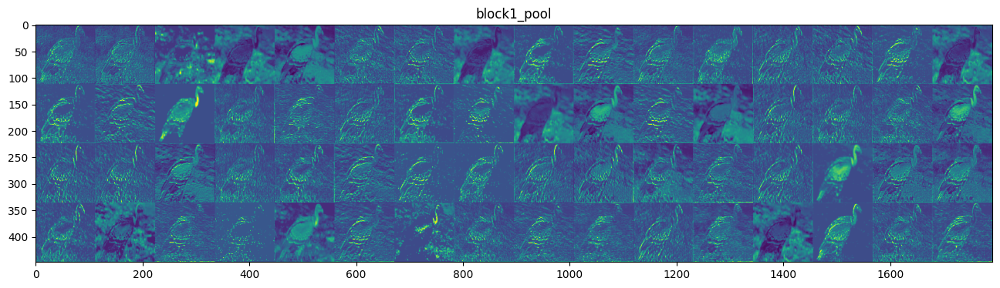

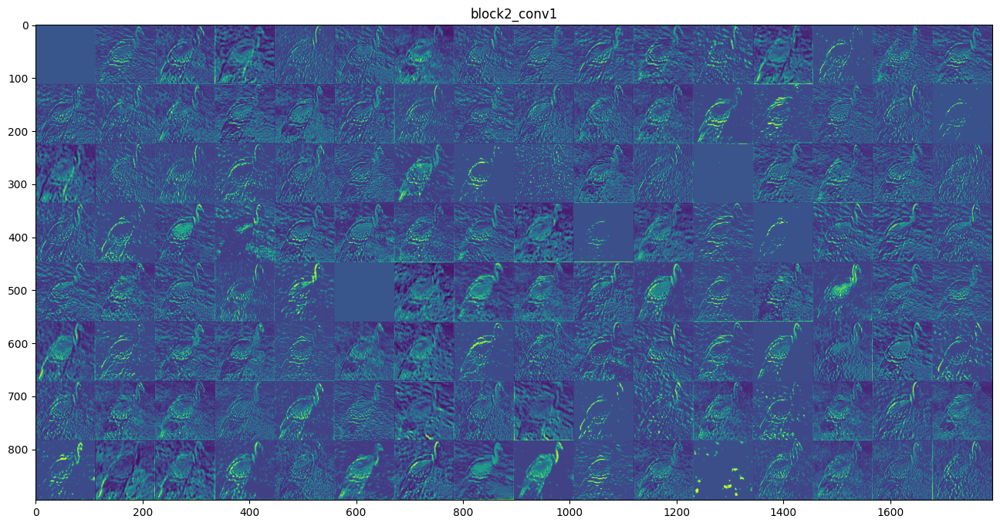

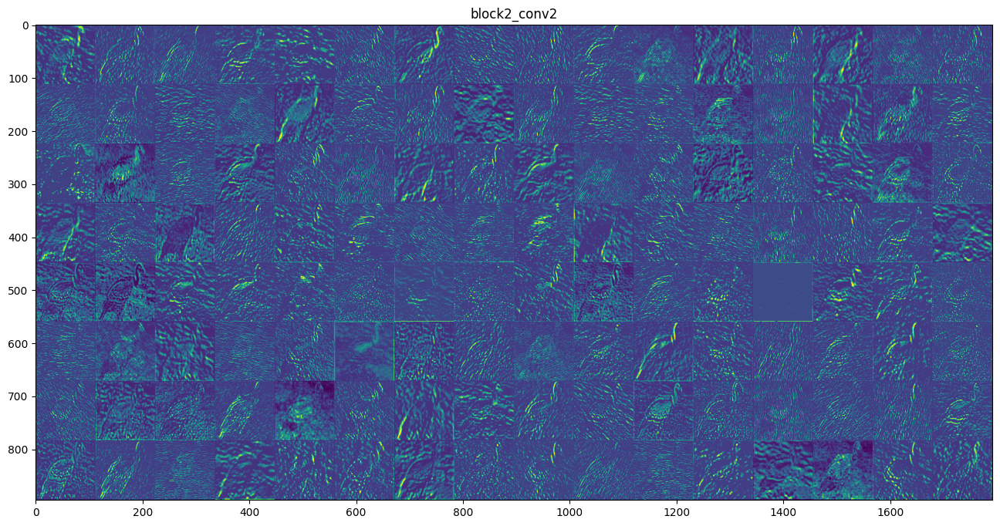

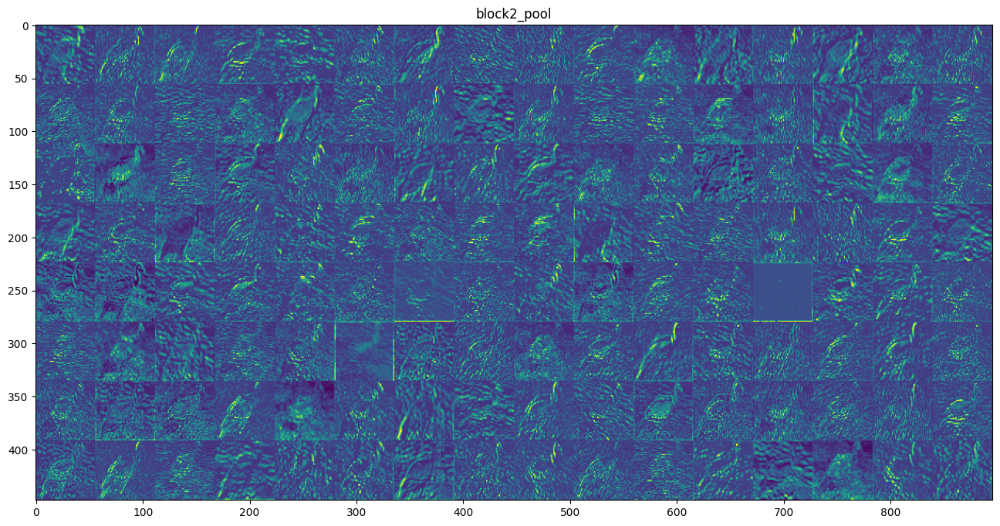

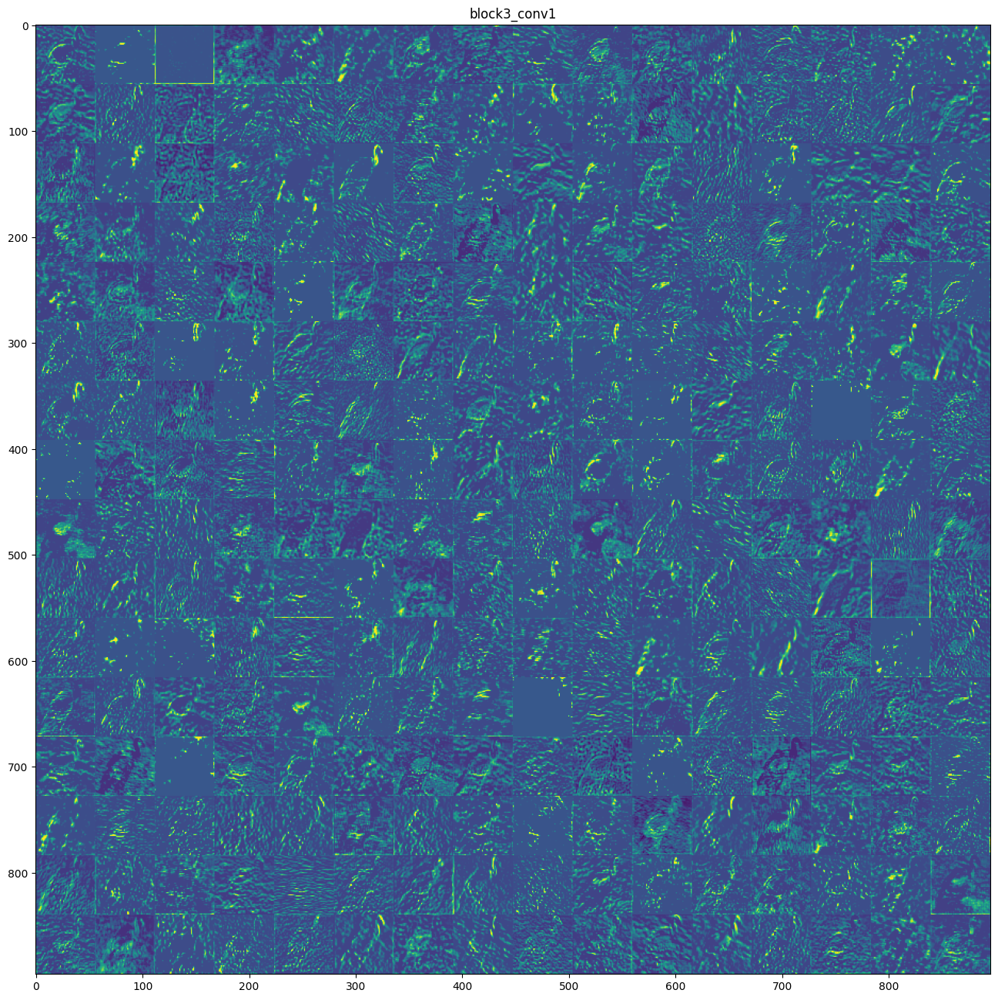

In [ ]:
import keras

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in model.layers[:8]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps (the activations variable is from the model.predict above)
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image = prepare_image_for_display(channel_image,
                                     norm_type = 'std')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()

Each small square represents a distinct feature map, capturing specific patterns such as edges, textures, and gradients that the convolutional filters have learned from ImageNet data. Notice how some squares highlight fine, wavy lines, while others emphasize bolder contours. Regions with bright green or blue indicate stronger activations, suggesting the presence of features that the network has deemed important. Dark patches reveal areas with minimal activation, indicating less relevant features for those filters. These patterns collectively form the building blocks for higher-level recognition, allowing the network to identify increasingly complex structures.

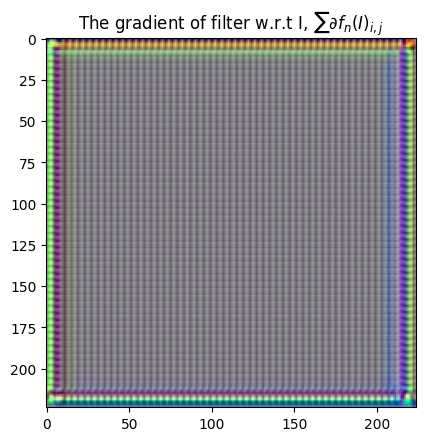

In [ ]:
from tensorflow.keras import models

layer_name = 'block3_conv2'
filter_index = 2

# Isolate the output of interest and create a new model
layer_output = model.get_layer(layer_name).output
new_model = models.Model(inputs=model.input, outputs=layer_output)

# Create a variable with the correct size (224, 224, 3) and dtype 'float32'
I = tf.Variable(np.zeros((1, 224, 224, 3), dtype='float32'), name='image_var')

# Define a function to normalize and prepare the gradient image for display
def prepare_image_for_display(img, norm_type='std'):
    if norm_type == 'std':
        img -= img.mean()
        img /= (img.std() + 1e-5)
        img *= 0.1

        # Clip to [0, 1]
        img += 0.5
        img = np.clip(img, 0, 1)

        # Convert to RGB
        img *= 255
        img = np.clip(img, 0, 255).astype('uint8')
    return img

# Use gradient tape to get the gradients
with tf.GradientTape(watch_accessed_variables=False) as tape:
    tape.watch(I)  # Watch the variable 'I'
    # Ensure 'I' is preprocessed properly for the model
    processed_I = preprocess_input(I)
    model_vals = new_model(processed_I)  # Get model output
    filter_output_to_maximize = tf.reduce_mean(model_vals[:, :, :, filter_index])  # Objective to maximize

grad_fn = tape.gradient(filter_output_to_maximize, I)  # Get gradients w.r.t. 'I'
grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)  # Normalize for stability

# Now show the gradient, same size as input image
plt.imshow(prepare_image_for_display(grad_fn.numpy()[0]))
plt.title('The gradient of filter w.r.t I, $ \sum\partial f_n(I)_{i,j} $')
plt.show()

This output shows a gradient visualization with a clear and bright border, suggesting significant gradient values at the edges. Inside the border, however, the image has a fine-grained, grid-like pattern.This pattern typically implies that the filter is sensitive to changes at the edges of the input space, which might be a common characteristic of a filter that detects boundaries or transitions.The fact that the grid-like pattern is uniform across the field suggests that the gradients are consistent across all regions of the input space.

In [ ]:
def generate_pattern(layer_name, filter_index, size=224):
    # Build a model that outputs the activation
    # of the nth filter of the layer considered.
    layer_output = model.get_layer(layer_name).output
    # Isolate the output
    new_model = models.Model(inputs=model.input, outputs=layer_output)

    # We start from a gray image with some uniform noise
    input_img_data = np.random.random((1, size, size, 3)) * 20 + 128.

    I_start = tf.Variable(input_img_data, name='image_var', dtype = 'float64')
    I = preprocess_input(I_start) # only process once
    # Run gradient ascent for 40 steps
    eta = 1.
    for i in range(40):
        with tf.GradientTape(watch_accessed_variables=False) as tape:
            tape.watch(I)
            # get variable to maximize
            model_vals = new_model(I)
            filter_output = tf.reduce_mean(model_vals[:, :, :, filter_index])

        # Compute the gradient of the input picture w.r.t. this loss
        # add this operation input to maximize
        grad_fn = tape.gradient(filter_output, I)
        # Normalization trick: we normalize the gradient
        grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5) # mean L2 norm
        I += grad_fn * eta # one iteration of maximizing

    # return the numpy matrix so we can visualize
    img = I.numpy().squeeze()  # .squeeze() will remove dimensions of size 1
    return prepare_image_for_display(img, norm_type='std')

In [ ]:
keras_layer =new_model.get_layer(layer_name)
layer_output = keras_layer.output
weights_list = keras_layer.get_weights() # list of filter, the biases
filters = weights_list[0]
biases = weights_list[1]

# print out some specifics of how the filter is saved
print(f'{layer_name} activation size is ', layer_output.get_shape(), '(batch x H x W x filter)')
print(f'{layer_name} filters is of shape',filters.shape, '...(k x k x channels x filters)')
print(f'{layer_name} biases is of shape',biases.shape)

idx = 32
print(f'one filter in {layer_name} is ', filters[:,:,:,idx].shape )
channel = 2
print('one channel in the the filter is', filters[:,:,channel,idx].shape)
print('The weights of that channel in the filter are:\n', filters[:,:,channel,idx])
print('The bias of the filter is:',biases[idx])

block3_conv2 activation size is  (None, 56, 56, 256) (batch x H x W x filter)
block3_conv2 filters is of shape (3, 3, 256, 256) ...(k x k x channels x filters)
block3_conv2 biases is of shape (256,)
one filter in block3_conv2 is  (3, 3, 256)
one channel in the the filter is (3, 3)
The weights of that channel in the filter are:
 [[0.00653948 0.01513926 0.00947011]
 [0.00729415 0.01344482 0.00609969]
 [0.01355778 0.02000019 0.01363138]]
The bias of the filter is: -0.007131762


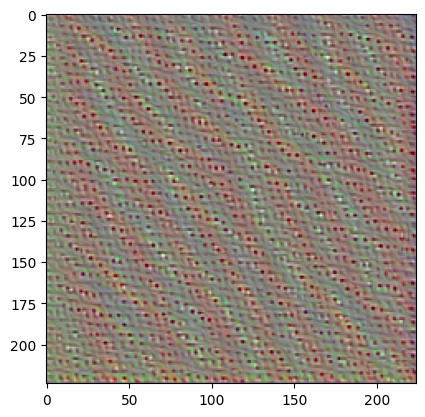

In [ ]:
img55=generate_pattern('block3_conv2', filter_index)
plt.imshow(img55)
plt.show()

The image above displays the maximal activation of the layer chosen. The image depicts a noisy, patterned texture that lacks a distinct structure or recognizable object. This kind of result is typical when the filter being maximized responds to a combination of colors or textures rather than a specific shape or object within the input space.There's a variety of colors dotted throughout the image, indicating that the filter may be detecting a range of different color edges or transitions rather than a specific hue. The overall noise-like appearance can indicate that the optimization hasn't converged to highlight a dominant feature that the filter responds to.

In [ ]:
#  lets look at the shapes of some of the filters above
keras_layer = model.get_layer(layer_name)
layer_output = keras_layer.output
weights_list = keras_layer.get_weights() # list of filter, the biases
filters = weights_list[0]
biases = weights_list[1]

# print out some specifics of how the filter is saved
print(f'{layer_name} activation size is ', layer_output.get_shape(), '(batch x H x W x filter)')
print(f'{layer_name} filters is of shape',filters.shape, '...(k x k x channels x filters)')
print(f'{layer_name} biases is of shape',biases.shape)

idx = 32
print(f'one filter in {layer_name} is ', filters[:,:,:,idx].shape )
channel = 2
print('one channel in the the filter is', filters[:,:,channel,idx].shape)
print('The weights of that channel in the filter are:\n', filters[:,:,channel,idx])
print('The bias of the filter is:',biases[idx])

block3_conv2 activation size is  (None, 56, 56, 256) (batch x H x W x filter)
block3_conv2 filters is of shape (3, 3, 256, 256) ...(k x k x channels x filters)
block3_conv2 biases is of shape (256,)
one filter in block3_conv2 is  (3, 3, 256)
one channel in the the filter is (3, 3)
The weights of that channel in the filter are:
 [[0.00653948 0.01513926 0.00947011]
 [0.00729415 0.01344482 0.00609969]
 [0.01355778 0.02000019 0.01363138]]
The bias of the filter is: -0.007131762


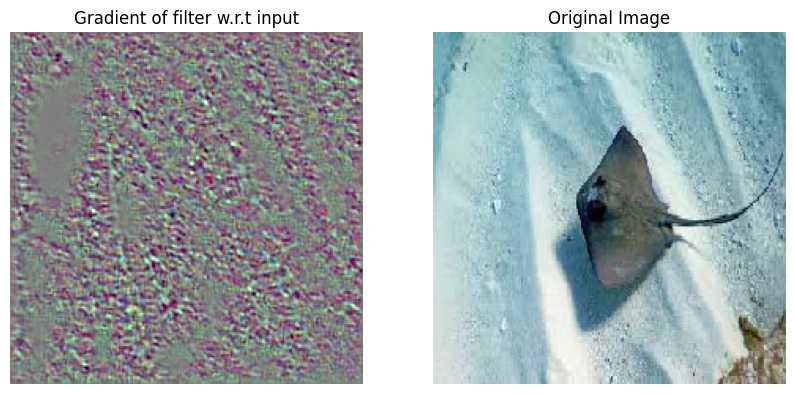

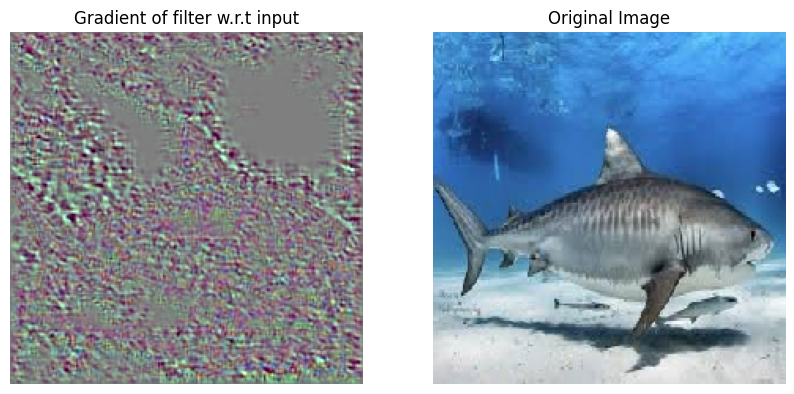

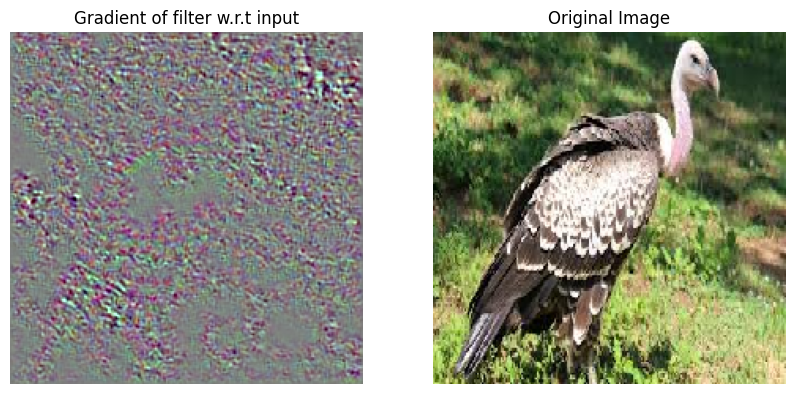

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
# Isolate the output of interest and create new model
layer_output = model.get_layer(layer_name).output
new_model = models.Model(inputs=model.input, outputs=layer_output)

# Placeholder paths for your images
img_paths = [
    '/content/drive/MyDrive/pics/stingray.jpg',
    '/content/drive/MyDrive/pics/tigershark.jpg',
    '//content/drive/MyDrive/pics/vulture.jpg'
]

for img_path in img_paths:
    # Load and preprocess the image
    img = load_img(img_path, target_size=(224, 224))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)

    # Update the I variable with your image
    I = tf.Variable(img_array, dtype='float32')

    # Use gradient tape to get the gradients
    with tf.GradientTape(watch_accessed_variables=False) as tape:
        tape.watch(I)
        model_vals = new_model(I)
        filter_output_to_maximize = tf.reduce_mean(model_vals[:, :, :, filter_index])

    grad_fn = tape.gradient(filter_output_to_maximize, I)
    grad_fn /= (tf.sqrt(tf.reduce_mean(tf.square(grad_fn))) + 1e-5)

    # Display the gradient image
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(prepare_image_for_display(grad_fn.numpy()[0]))
    plt.title('Gradient of filter w.r.t input')
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.axis('off')
    plt.title('Original Image')

    plt.show()

The images on the left represents the gradient of a filter with respect to the input image. This visualization is a way to understand which parts of the input image are most influential in activating a particular filter.The gradient image doesn't present any recognizable features but displays a noisy, high-frequency pattern. This suggests that the filter in question is sensitive to textures and colors but doesn't necessarily correspond to a distinct feature within the image, like the shape of the target object or specific parts of it.

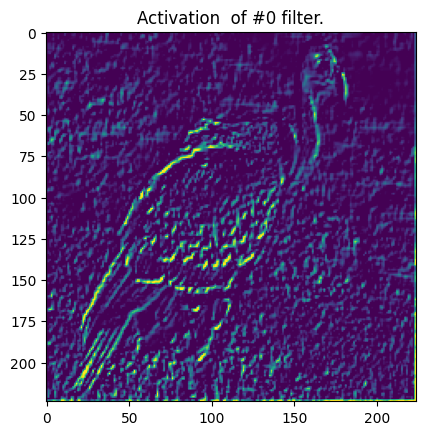

In [ ]:
idx_filter = 0
second_layer_activation = activations[1] # get activation from list
one_channel = second_layer_activation[0, :, :, idx_filter]
plt.imshow(prepare_image_for_display(one_channel,
                                     norm_type = 'std'))
plt.title(f'Activation  of #{idx_filter} filter.')
plt.show()

The areas of bright yellow and green indicate regions where this particular filter is most activated. These high activations follow the shape of the vulture, indicating that the filter is responding strongly to features or edges that define the vultures's silhouette.

Hypothesis: Based on the output of the activation of this multichannel filter's output, it would appear that this circuit funtions as an edge detector within VGG16, responding to changes in textures.

In [ ]:
layer = new_model.get_layer(name=layer_name)
specific_filter = filters[:, :, :, filter_index]
# Get the weights of the layer
# weights[0] contains the filters, weights[1] contains the biases
filters, biases = layer.get_weights()
# Calculate the L2 norm of each filter across all its weights
l2_norms = np.sqrt(np.sum(np.square(specific_filter), axis=(0, 1)))

# Sort the filters based on the L2 norm and select the top 10 indices
top_ten_indices = np.argsort(l2_norms)[-10:]
# The shape of filters is (filter_height, filter_width, input_channels, output_channels)
print(f"Shape of the filters in {layer_name}: {filters.shape}")


print(f"All weights from {layer_name}")
for x in filters:
    print(x)

Shape of the filters in block3_conv2: (3, 3, 256, 256)
All weights from block3_conv2
[[[-0.01032663 -0.00257659  0.00023917 ... -0.00118999 -0.00975548
   -0.00247324]
  [-0.00987035 -0.00188853  0.00027567 ... -0.00998694 -0.00598259
    0.00440906]
  [ 0.01618356 -0.00938058 -0.00673406 ... -0.00242401  0.0109589
    0.01391672]
  ...
  [-0.01401766 -0.00308812  0.00341502 ...  0.00533249 -0.01703558
   -0.01363592]
  [ 0.00174194 -0.00995234 -0.0004359  ... -0.00241841 -0.01685557
    0.0105464 ]
  [-0.0047731  -0.00666777  0.00507127 ... -0.00120527  0.00355558
    0.0011733 ]]

 [[-0.00664286 -0.00347881  0.0023919  ... -0.00753906 -0.00572045
   -0.00924839]
  [-0.00297288  0.00334521 -0.0031863  ... -0.01156237 -0.00790791
    0.00592659]
  [ 0.02537774  0.00253286  0.02177078 ...  0.02153028  0.01672795
    0.02455831]
  ...
  [-0.00773528  0.0067616  -0.00116095 ...  0.00441491 -0.01448656
   -0.01290209]
  [ 0.01032175 -0.00736615 -0.00586766 ... -0.00404951 -0.01985915
    0

In [ ]:
print("Shape of filters:", filters.shape)

Shape of filters: (3, 3, 256, 256)


In [ ]:
def maximize_activation(model, layer_name, filter_index, iterations=30, step_size=1.0):
    # Define a loss function that is the mean of the activation
    # of a specific filter within the layer
    layer_output = model.get_layer(name=layer_name).output
    loss = tf.reduce_mean(layer_output[:, :, :, filter_index])

    # Start from a gray image with some noise
    input_img = tf.random.uniform((1, 224, 224, 3), 0, 255)

    # Instantiate a model that returns the loss given the input
    grad_model = tf.keras.models.Model([model.inputs], [loss])

    for _ in range(iterations):
        with tf.GradientTape() as tape:
            tape.watch(input_img)
            loss_value = grad_model(input_img)

        # Calculate the gradients of the loss w.r.t the input image
        grads = tape.gradient(loss_value, input_img)
        # Normalize the gradients
        grads /= (tf.sqrt(tf.reduce_mean(tf.square(grads))) + 1e-5)
        # Update the image by following the gradients
        input_img += grads * step_size

    # Decode the final image
    img = input_img[0].numpy()
    img = (img - img.min()) / (img.max() - img.min())
    img *= 255
    img = np.clip(img, 0, 255).astype('uint8')
    return img


In [ ]:
def get_filter_activation(model, img, filter_index):
    activations = new_model.predict(img1)
    # Assuming the filter activation is the mean across the spatial dimensions
    filter_activation = np.mean(activations[:, :, :, filter_index])
    return filter_activation

In [ ]:
new_activations = []

img1 = x1
activation = get_filter_activation(new_model, img1, filter_index=1)  # For the 3rd filter
new_activations.append(activation)



img2 = x2
activation = get_filter_activation(new_model, img2, filter_index=2)
new_activations.append(activation)




print(f" activations for the stingray and tiger shark classes: {new_activations}")



1/1 [==============================] - 0s 251ms/step
 activations for the stingray and tiger shark classes: [173.36375, 525.34875]


Testing the activations of different classes we can see that the tiger shark class results in a greater magnitude of activations within this circuit as opposed to the stingray class.

In [ ]:
def categorize_filter(filter_weights):
    positive_sum = np.sum(filter_weights[filter_weights > 0])
    negative_sum = np.sum(filter_weights[filter_weights < 0])

    if np.abs(negative_sum) > positive_sum:
        return "mostly inhibitory"
    else:
        return "mostly excitatory"

# Using top_ten_indices from previous steps to identify top filters
categories = [categorize_filter(specific_filter[:, :, idx]) for idx in top_ten_indices]

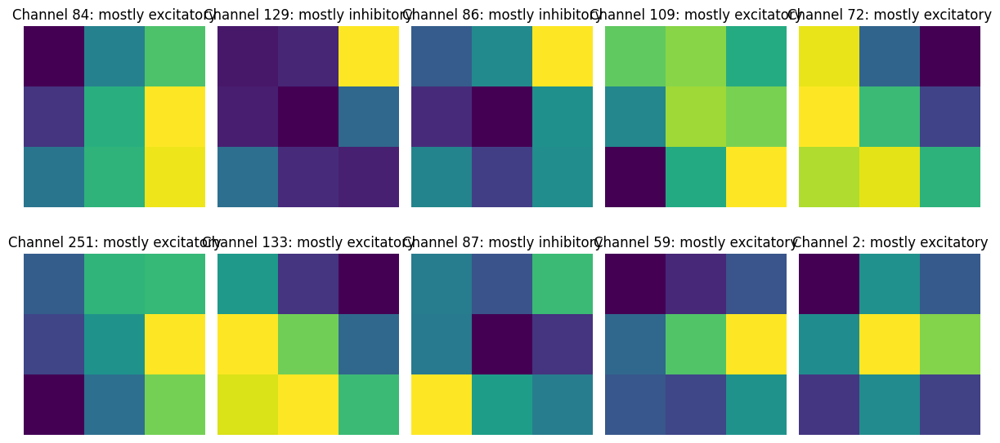

In [ ]:
#Visualizing the filters.

fig, axes = plt.subplots(2, 5, figsize=(12, 6))

for i, ax in enumerate(axes.flat):
    idx = top_ten_indices[i]
    filter_weights = specific_filter[:, :, idx]
    category = categorize_filter(filter_weights)

    ax.imshow(filter_weights, cmap='viridis')
    ax.set_title(f"Channel {idx}: {category}")
    ax.axis('off')

plt.tight_layout()
plt.show()


 Each block corresponds to a specific channel in a this layer. Channel index is  listed. "Excitatory" likely means that the activation values are positive and that the filter is actively responding to the input features. "Inhibitory" suggests that the filter's activations are negative or suppressive in response to the input.The colors within each block may represent the magnitude of the L2 norm of the filter activations. Typically, brighter colors might represent higher L2 norms, indicating stronger activations. By analyzing the L2 norms, one can gain insights into the feature selectivity and complexity of the filters within the network. Filters with higher norms are more active and may be crucial for the network's performance, while lower-norm filters might be less important.

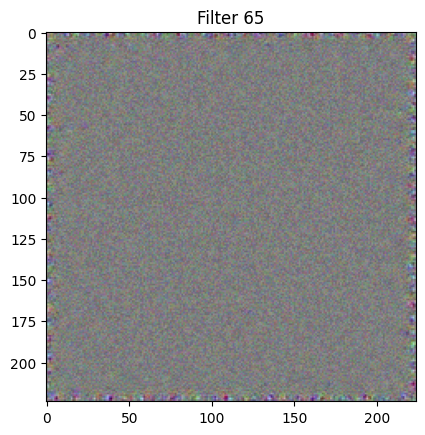

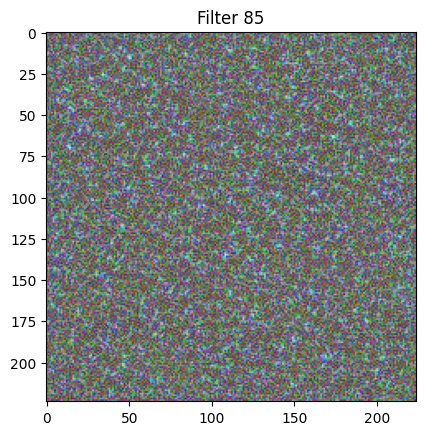

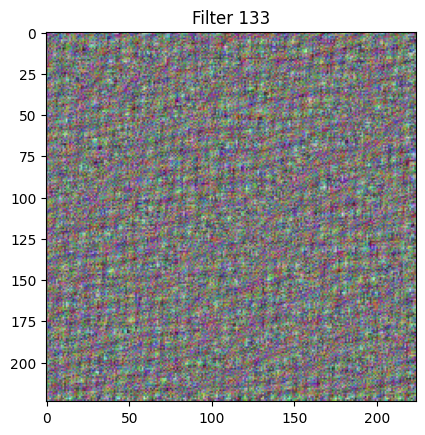

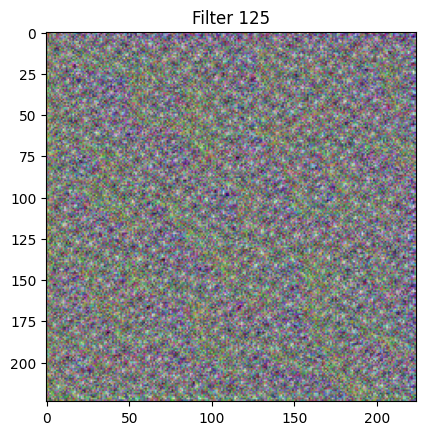

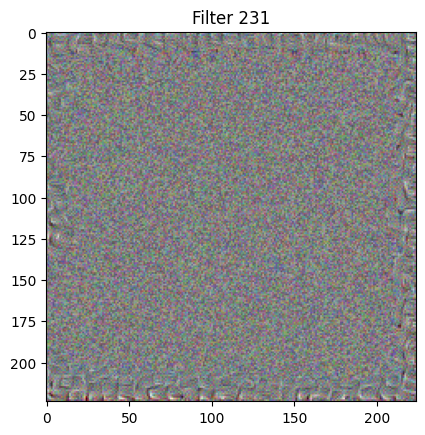

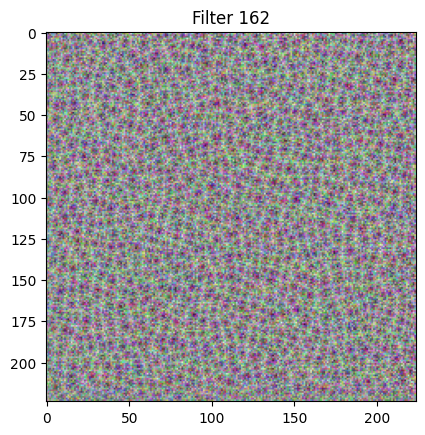

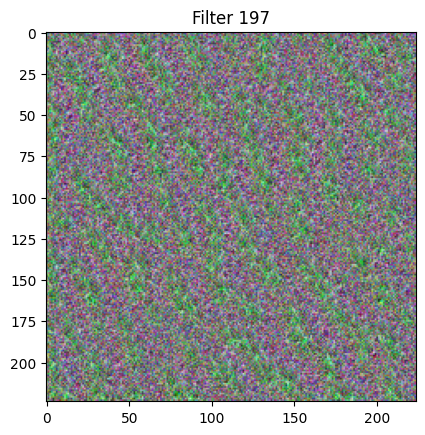

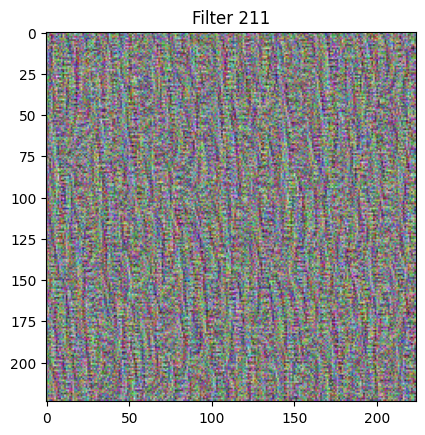

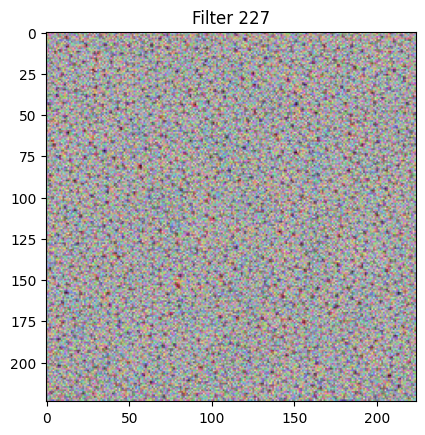

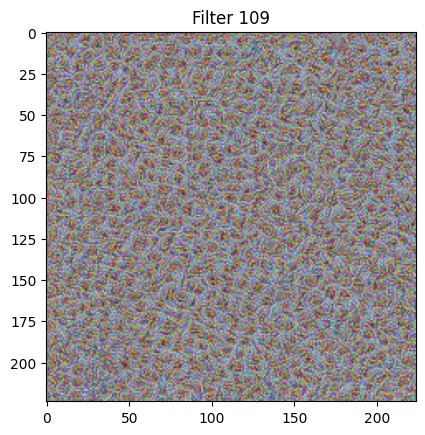

In [ ]:
for filter_index in top_ten_indices:
    img = maximize_activation(model, layer_name, filter_index)
    plt.figure()
    plt.title(f'Filter {filter_index}')
    plt.imshow(img)
    plt.show()

Filter 65:The filter may be responding to high-frequency features in the input, such as edges or textures, which are often represented by rapid changes in color or intensity. The graininess of the image indicates that the filter is sensitive to these high-frequency changes rather than smooth transitions or larger, more coherent structures.The variety of colors present in the noise could mean that this filter is sensitive to a range of color frequencies, detecting subtle variations in color that are not immediately obvious to the human eye.The absence of a discernible pattern may indicate that this filter does not detect a specific shape or object meaining this could represent a polysemantic neuron that responds in a noisy manner to inputs of varying classes.

Filter 85:The filter may be detecting textural patterns in the input image, as indicated by the noisy output. It might be responding to very fine details that do not represent a coherent structure on their own.The uniformity of the noise across the visualization could also indicate that the filter does not have a strong activation for any particular feature within the input space it was presented with higlhlighting its polysemantic nature.

Filter 133 this filter also presents a noisy pattern with no discernible features, which is often characteristic of an individual filter's activation in response to an input image or the visualization of the filter itself. The granular detail observed in the image suggests that "Filter 133" may be detecting fine textures or patterns that are complex and not easily interpreted by the human eye.

Filter 125 this visualization suggests that the filter is likely detecting patterns or features that are highly textured and perhaps complex in nature. The speckled, multi-colored appearance indicates sensitivity to a variety of features, likely at a high frequency or fine-grained level, it may also mean that the optimization process has led to a local maximum that does not correspond to a meaningful visual pattern. The filter appears to be sensitive to multiple colors, suggesting that it could play a role in detecting color gradients or edges within the visual input.

Filter 231 The image shows a granular and textured pattern similar to visual noise, which indicates the filter may be sensitive to texture-like features in the input. The lack of discernible structures or objects in the optimization output suggests this filter may not be tuned to any specific high-level feature or that the optimization process did not converge to a visually interpretable pattern. There appears to be a different pattern or artifact present in the lower part of the image. This could indicate an edge effect in the optimization process or a sign of where the activation is not uniform across the spatial extent of the filter.

Filter 162 The image has a high-frequency noise-like pattern, indicating that the filter may be sensitive to fine textures or edges rather than specific objects or large-scale features.

Filter 197 The visualization suggests that Filter 197 is responsive to fine-grained textural information. The apparent randomness of the pattern could indicate that this filter responds to a wide variety of textural patterns, rather than to any specific shape or structure. The multi-colored speckled pattern implies that the filter could be sensitive to different colors or to changes in color, perhaps detecting subtle variations in hue that might be present in the training data.

Filter 211 Similar to other filters, the visualization shows a noisy, high-frequency pattern. This suggests that "Filter 211" is responsive to texture-like patterns or edge details at a fine scale, which is a common property for early-layer filters in a CNN. The diverse array of colors might indicate that the filter reacts to color transitions or a mix of colors at certain spatial frequencies. This kind of sensitivity can be useful for detecting color patterns that are characteristic of certain objects or scenes the network has been exposed to.

Filter 227 This filter shows a highly textured pattern with a great deal of noise, indicating that the filter may be sensitive to fine-grained patterns or high-frequency information. The image contains multiple colors, which suggests that the filter may respond to a variety of color patterns or transitions rather than being tuned to specific hues or objects.

Filter 109 The noise-like appearance with multi-colored speckles suggests that this filter responds to a variety of fine-grained textures and possibly color transitions within the input. The absence of any coherent shapes or specific features might imply that "Filter 109" isn't selective for any high-level or object-specific characteristics.

##Conclusion
After analyzing the behavior of the VGG16 model, isolated at the block3_conv2 layer, I can conclude that this circuit responds most completely to noisy textures of various patterns and functions in aggregate as an edge detector.